# Week 4 Individual Assignment

Hello! In this notebook, we will explore any potential relationship between road conditions and the frequency of traffic collisions. 

Let's start with importing the necessary packages. 

In [1]:
import pandas as pd
import geopandas as gpd
import folium

I found [data](https://data.lacity.org/City-Infrastructure-Service-Requests/Road-Surface-Condition-Map/d9rz-k88a) on road conditions in LA, updated by the Public Works department in December 2023. Let's check out this file.

In [2]:
df_condition = gpd.read_file('data/Road Surface Condition Map.zip')
df_condition.head()

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


,from,pci,sect_id,st_name,st_type,status,street_typ,surf1,surface,to,zlength,zwidth,geometry
0,83RD ST,78.09,5776100,WADSWORTH AVE,Local,Good,LO,Asphalt,AS,84TH ST,310.0,30.0,"LINESTRING (-118.25858 33.96379, -118.25858 33..."
1,HOOVER ST,94.37,6773300,110TH ST,Local,Good,LO,Asphalt,AS,BARING CROSS ST,720.0,36.0,"LINESTRING (-118.28694 33.93560, -118.28937 33..."
2,BLACKWELDER ST,36.00,1229900,COCHRAN AVE,Local,Poor,LO,Concrete,PC,HOMESIDE AV,290.0,30.0,"LINESTRING (-118.36035 34.02763, -118.36065 34..."
3,OBAMA BL,82.06,4363900,POTOMAC AVE,Local,Good,LO,Asphalt,AS,COLISEUM ST,1175.0,34.0,"LINESTRING (-118.34420 34.02149, -118.34420 34..."
4,115TH ST,71.40,5149200,SUCCESS AVE,Local,Good,LO,Asphalt,AS,IMPERIAL HY,270.0,40.0,"LINESTRING (-118.24927 33.93025, -118.24928 33..."


Hm... the status, surface, and street type could be useful to look at. Let's see what unique values are contained within those fields.

In [3]:
print("Status Options: ")
status_list = df_condition.status.unique().tolist()
print(status_list)
print("Street Type Options: ")
streettype_list = df_condition.st_type.unique().tolist()
print(streettype_list)
print("Surface Options: ")
surf_list = df_condition.surf1.unique().tolist()
print(surf_list)

Status Options: 
['Good', 'Poor', 'Fair']
Street Type Options: 
['Local', 'Select']
Surface Options: 
['Asphalt', 'Concrete']


Breakdown of # of Streets in each category

In [4]:
print("Total # of Streets: " + str(df_condition.shape[0])  + "\n\nStatus")

for status in status_list:
    print(status + ": " + str(df_condition.loc[df_condition.status==status].shape[0]))

print("\n Street Type")
for streettype in streettype_list:
    print(streettype + ": " + str(df_condition.loc[df_condition.st_type==streettype].shape[0]))

print("\nSurface")
for surface in surf_list:
    print(surface + ": " + str(df_condition.loc[df_condition.surf1==surface].shape[0]))

Total # of Streets: 72563

Status
Good: 43974
Poor: 18195
Fair: 10394

 Street Type
Local: 51835
Select: 20728

Surface
Asphalt: 67794
Concrete: 4769


Let's merge these characteristics together

In [5]:
status_street_table = pd.DataFrame(index=status_list,columns=pd.MultiIndex.from_product([streettype_list,surf_list]))


for status in status_list:
    for streettype in streettype_list:
        for surface in surf_list:
            status_street_table.loc[status,(streettype,surface)] = df_condition.loc[(df_condition.status==status) & (df_condition.st_type==streettype) & (df_condition.surf1==surface)].shape[0]

pd.get_option('display.max_rows')
pd.get_option('display.max_columns')

status_street_table

Local           Select         
     Asphalt Concrete Asphalt Concrete
Good   33230      166   10407      171
Poor    8054     3462    6164      515
Fair    6584      339    3355      116

It seems like most of the local roads made of concrete are in poor condition. On the other hand, most roads made of asphalt and seem to be in good condition. Let's add another layer of data into this: road width and length.

In [6]:
#descriptive stats
print("Road Width")
print(df_condition["zwidth"].describe())

print("Road Length")
print(df_condition["zlength"].describe())

Road Width
count    72563.000000
mean        39.299106
std         14.159509
min          4.000000
25%         30.000000
50%         36.000000
75%         40.000000
max        136.000000
Name: zwidth, dtype: float64
Road Length
count    72563.000000
mean       520.293221
std        397.551759
min         20.000000
25%        300.000000
50%        375.000000
75%        660.000000
max       7985.000000
Name: zlength, dtype: float64


Five longest road segments in the data set

In [7]:
df_condition.sort_values(by='zlength',ascending=False).head(5)

,from,pci,sect_id,st_name,st_type,status,street_typ,surf1,surface,to,zlength,zwidth,geometry
19056,WHEATLAND AV,66.41,5866100,WENTWORTH ST,Select,Fair,SE,Asphalt,AS,STONEHURST AV,7985.0,63.0,"LINESTRING (-118.35647 34.26608, -118.36418 34..."
11096,WHEATLAND AV,66.41,5866100,WENTWORTH ST,Select,Fair,SE,Asphalt,AS,STONEHURST AV,7985.0,63.0,"LINESTRING (-118.35421 34.26593, -118.35580 34..."
71416,WHEATLAND AV,66.41,5866100,WENTWORTH ST,Select,Fair,SE,Asphalt,AS,STONEHURST AV,7985.0,63.0,"LINESTRING (-118.36824 34.26390, -118.36859 34..."
71417,WHEATLAND AV,66.41,5866100,WENTWORTH ST,Select,Fair,SE,Asphalt,AS,STONEHURST AV,7985.0,63.0,"LINESTRING (-118.37435 34.25740, -118.37556 34..."
50319,ANAHEIM ST,81.23,2106300,GAFFEY ST,Select,Good,SE,Asphalt,AS,WESTMONT DR,7250.0,68.0,"LINESTRING (-118.29604 33.77572, -118.29605 33..."


I think the duplicates are originating from the fact that the lines in the geometry column are different. I had to Google Maps this one, it seems like the lines split slightly. This noise can be removed.

In [8]:
df_condition[["from","st_name","st_type","status","surf1","to","zlength","zwidth"]].drop_duplicates().sort_values(by='zlength',ascending=False).head(5)

,from,st_name,st_type,status,surf1,to,zlength,zwidth
11096,WHEATLAND AV,WENTWORTH ST,Select,Fair,Asphalt,STONEHURST AV,7985.0,63.0
33558,ANAHEIM ST,GAFFEY ST,Select,Good,Asphalt,WESTMONT DR,7250.0,68.0
8741,150' S/O BROADLAWN DR,MULTIVIEW DR,Local,Fair,Asphalt,MULHOLLAND DR,7200.0,27.0
28586,CL N/O MOUNT GLEASON AV,BIG TUJUNGA CANYON ROAD,Select,Good,Asphalt,MT GLEASON AV,7140.0,23.0
2268,SANDPIPER ST,VISTA DEL MAR,Select,Poor,Asphalt,IMPERIAL HY,6735.0,56.0


This isn't useful, I just want to know.

In [9]:
df_condition.loc[df_condition.st_name.str.contains("wilshire",case=False,na=False)]

,from,pci,sect_id,st_name,st_type,status,street_typ,surf1,surface,to,zlength,zwidth,geometry
630,BEAUDRY AV,30.08,6028700,WILSHIRE BLVD,Select,Poor,SE,Asphalt,AS,ST PAUL AV,190.0,56.0,"LINESTRING (-118.26148 34.05149, -118.26201 34..."
1483,WILTON PL,77.54,6033100,WILSHIRE BLVD,Select,Good,SE,Asphalt,AS,VAN NESS AV,325.0,70.0,"LINESTRING (-118.31419 34.06169, -118.31435 34..."
1827,BRONSON AV,70.60,6033400,WILSHIRE BLVD,Select,Fair,SE,Asphalt,AS,IRVING BL,210.0,70.0,"LINESTRING (-118.31788 34.06170, -118.31850 34..."
1828,LUCERNE BL,87.28,6034000,WILSHIRE BLVD,Select,Good,SE,Asphalt,AS,ARDEN BL,470.0,70.0,"LINESTRING (-118.32565 34.06188, -118.32580 34..."
2039,SYCAMORE AV,75.85,6035500,WILSHIRE BLVD,Select,Good,SE,Asphalt,AS,LA BREA AV,350.0,35.0,"LINESTRING (-118.34292 34.06220, -118.34300 34..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69292,HOLMBY AV,85.31,6039900,WILSHIRE BLVD,Select,Good,SE,Asphalt,AS,WARNER AV,1020.0,80.0,"LINESTRING (-118.43007 34.06637, -118.43222 34..."
70105,VAN NESS AV,85.42,6033200,WILSHIRE BLVD,Select,Good,SE,Asphalt,AS,NORTON AV,395.0,70.0,"LINESTRING (-118.31658 34.06170, -118.31673 34..."
70694,ORANGE GROVE AV,55.15,6038600,WILSHIRE BLVD,Select,Poor,SE,Asphalt,AS,FAIRFAX AV,340.0,35.0,"LINESTRING (-118.36060 34.06282, -118.36131 34..."
70886,GRANVILLE AV,57.21,6041300,WILSHIRE BLVD,Select,Fair,SE,Asphalt,AS,WESTGATE AV,370.0,75.0,"LINESTRING (-118.46262 34.04803, -118.46304 34..."


### TRIVIA TIME

What is the length of Wilshire Boulevard?

In [10]:
df_wilshire = df_condition.loc[df_condition.st_name.str.contains("wilshire",case=False,na=False)].drop("geometry",axis=1).drop_duplicates()
print("Average width: " + str(int(df_wilshire["zwidth"].mean())))
print("Total length: " + str(df_wilshire["zlength"].sum()))

Average width: 62
Total length: 58915.0


In [11]:
df_condition.loc[df_condition.st_name.str.contains("sepulveda",case=False,na=False)]

,from,pci,sect_id,st_name,st_type,status,street_typ,surf1,surface,to,zlength,zwidth,geometry
1058,ALBERS ST,20.05,4904700,SEPULVEDA BLVD,Select,Poor,SE,Asphalt,AS,CLARK ST,680.0,87.0,"LINESTRING (-118.46616 34.16847, -118.46616 34..."
1126,ROSCOE BL,76.84,4916400,SEPULVEDA PL,Local,Good,LO,Asphalt,AP,BURTON ST,500.0,38.0,"LINESTRING (-118.46621 34.22008, -118.46621 34..."
1205,PARTHENIA ST,12.05,4901800,SEPULVEDA BLVD,Select,Poor,SE,Asphalt,AS,CHASE ST,1305.0,88.0,"LINESTRING (-118.46770 34.22465, -118.46766 34..."
1719,LOCKNESS AV,83.69,4915200,SEPULVEDA BLVD,Select,Good,SE,Asphalt,AS,WESTERN AV,1430.0,86.0,"LINESTRING (-118.30447 33.81540, -118.30879 33..."
2113,SHERMAN OAKS AV,38.52,4906800,SEPULVEDA BLVD,Select,Poor,SE,Asphalt,AS,HIGH KNOLL RD,380.0,60.0,"LINESTRING (-118.47235 34.14601, -118.47204 34..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71133,CL W/O TERMINAL ISLAND FY,18.09,4914900,SEPULVEDA BLVD,Select,Poor,SE,Asphalt,AS,CL E/O ALAMEDA ST,1390.0,82.0,"LINESTRING (-118.22423 33.80503, -118.22423 33..."
71284,CASHMERE ST,71.16,4909300,SEPULVEDA BLVD,Select,Good,SE,Asphalt,AS,CL S/O CASHMERE ST,1560.0,55.0,"LINESTRING (-118.46022 34.06614, -118.45603 34..."
71360,CL E/O HALLDALE AV,76.98,4915000,SEPULVEDA BLVD,Select,Good,SE,Asphalt,AS,HALLDALE AV,890.0,88.0,"LINESTRING (-118.29851 33.81321, -118.30031 33..."
71361,CL E/O HALLDALE AV,76.98,4915000,SEPULVEDA BLVD,Select,Good,SE,Asphalt,AS,HALLDALE AV,890.0,88.0,"LINESTRING (-118.30050 33.81394, -118.30139 33..."


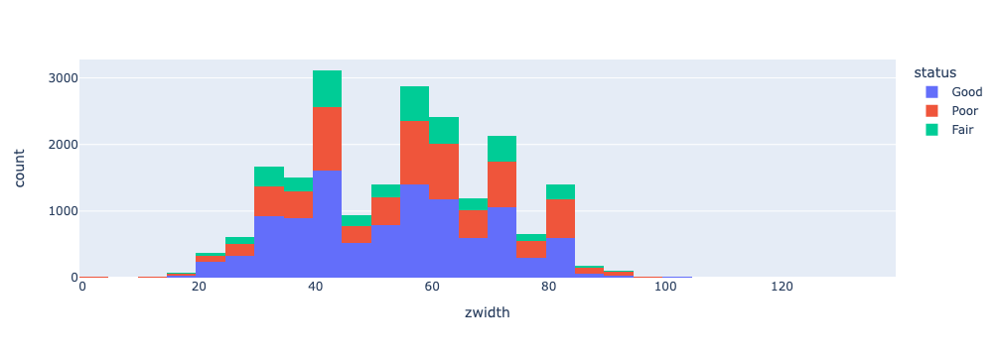

In [12]:
import plotly.express as px
fig = px.histogram(df_condition[df_condition.st_type=="Select"], x="zwidth", color="status",nbins=30)
fig.show()



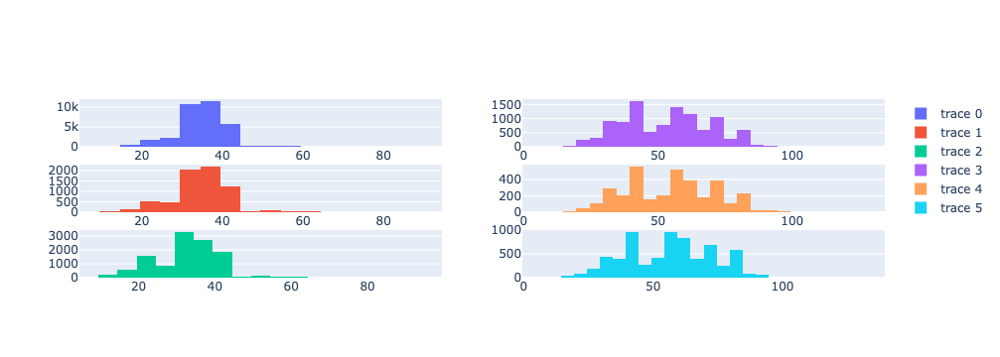

In [13]:

from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=2)

fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Local") & (df_condition.status=="Good"),"zwidth"].tolist(),
    nbinsx=30), row=1, col=1)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Local") & (df_condition.status=="Fair"),"zwidth"].tolist(),
    nbinsx=30), row=2, col=1)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Local") & (df_condition.status=="Poor"),"zwidth"].tolist(),
    nbinsx=30), row=3, col=1)

fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Select") & (df_condition.status=="Good"),"zwidth"].tolist(),
    nbinsx=30), row=1, col=2)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Select") & (df_condition.status=="Fair"),"zwidth"].tolist(),
    nbinsx=30), row=2, col=2)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Select") & (df_condition.status=="Poor"),"zwidth"].tolist(),
    nbinsx=30), row=3, col=2)

fig.show()

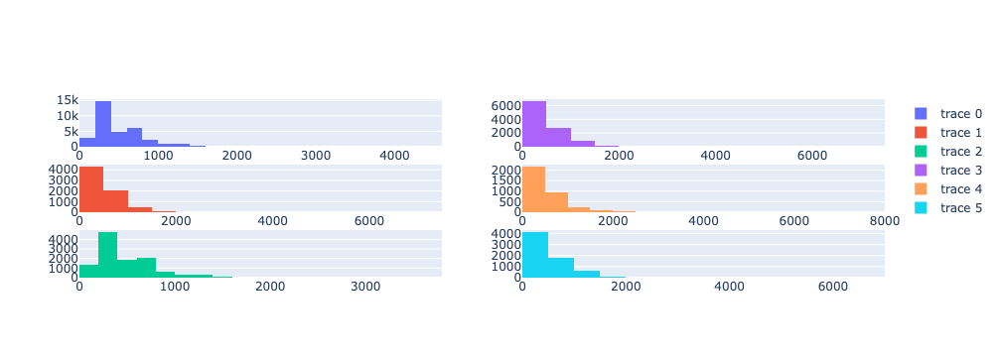

In [14]:

from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=2)

fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Local") & (df_condition.status=="Good"),"zlength"].tolist(),
    nbinsx=30), row=1, col=1)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Local") & (df_condition.status=="Fair"),"zlength"].tolist(),
    nbinsx=30), row=2, col=1)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Local") & (df_condition.status=="Poor"),"zlength"].tolist(),
    nbinsx=30), row=3, col=1)

fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Select") & (df_condition.status=="Good"),"zlength"].tolist(),
    nbinsx=30), row=1, col=2)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Select") & (df_condition.status=="Fair"),"zlength"].tolist(),
    nbinsx=30), row=2, col=2)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.st_type=="Select") & (df_condition.status=="Poor"),"zlength"].tolist(),
    nbinsx=30), row=3, col=2)

fig.show()

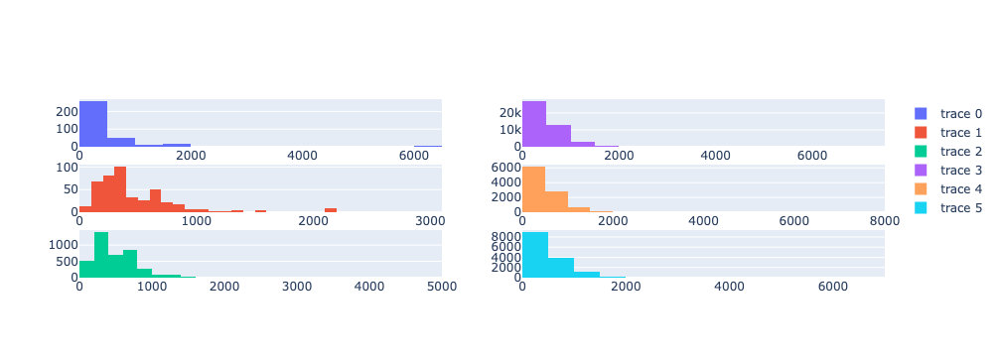

In [15]:

from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=2)

fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Concrete") & (df_condition.status=="Good"),"zlength"].tolist(),
    nbinsx=30), row=1, col=1)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Concrete") & (df_condition.status=="Fair"),"zlength"].tolist(),
    nbinsx=30), row=2, col=1)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Concrete") & (df_condition.status=="Poor"),"zlength"].tolist(),
    nbinsx=30), row=3, col=1)

fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Asphalt") & (df_condition.status=="Good"),"zlength"].tolist(),
    nbinsx=30), row=1, col=2)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Asphalt") & (df_condition.status=="Fair"),"zlength"].tolist(),
    nbinsx=30), row=2, col=2)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Asphalt") & (df_condition.status=="Poor"),"zlength"].tolist(),
    nbinsx=30), row=3, col=2)

fig.show()

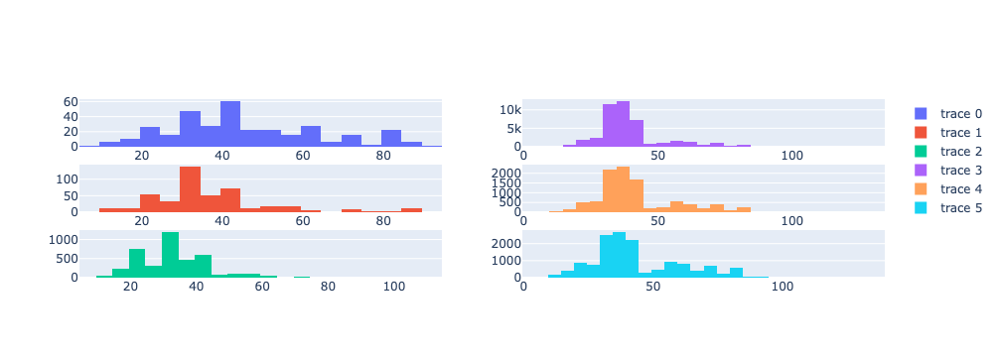

In [16]:

from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=2)

fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Concrete") & (df_condition.status=="Good"),"zwidth"].tolist(),
    nbinsx=30), row=1, col=1)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Concrete") & (df_condition.status=="Fair"),"zwidth"].tolist(),
    nbinsx=30), row=2, col=1)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Concrete") & (df_condition.status=="Poor"),"zwidth"].tolist(),
    nbinsx=30), row=3, col=1)

fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Asphalt") & (df_condition.status=="Good"),"zwidth"].tolist(),
    nbinsx=30), row=1, col=2)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Asphalt") & (df_condition.status=="Fair"),"zwidth"].tolist(),
    nbinsx=30), row=2, col=2)
fig.append_trace(go.Histogram(x=df_condition.loc[(df_condition.surf1=="Asphalt") & (df_condition.status=="Poor"),"zwidth"].tolist(),
    nbinsx=30), row=3, col=2)

fig.show()

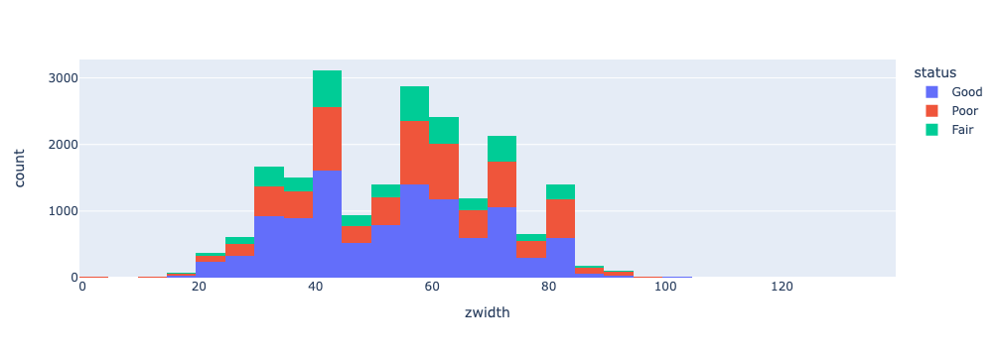

In [17]:
import plotly.express as px
fig = px.histogram(df_condition[df_condition.st_type=="Select"], x="zwidth", color="status",nbins=50)
fig.show()

<Axes: >

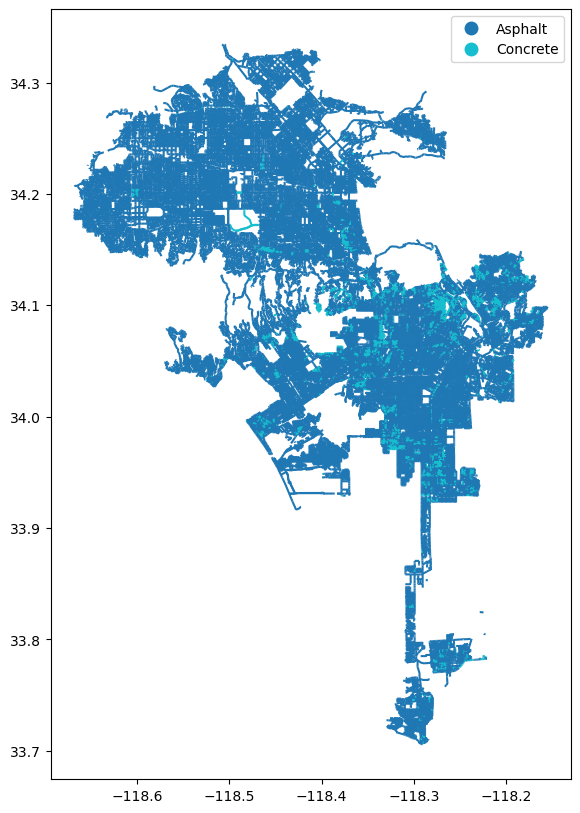

In [18]:
df_condition.plot(figsize=(12,10),
                 column="surf1",
                 legend=True)


<Axes: >

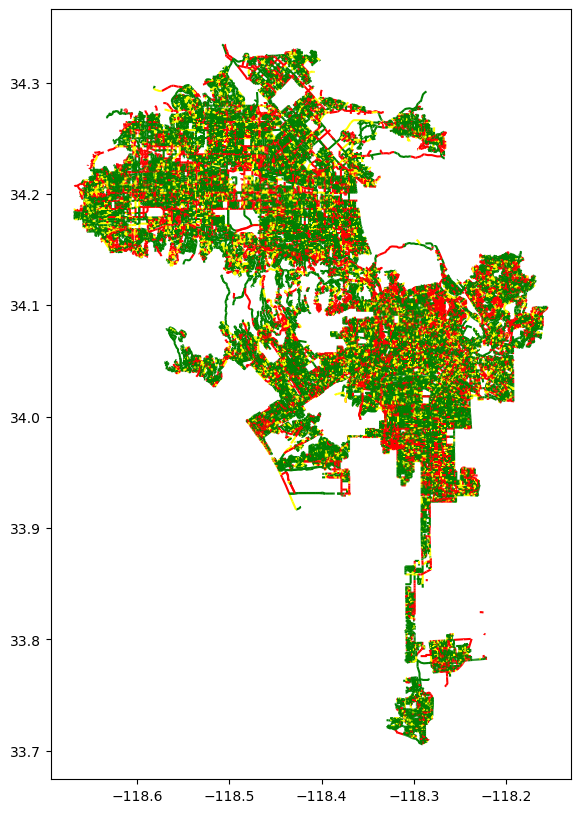

In [19]:
df_colorcond = df_condition
df_colorcond["flag"] = "green"
df_colorcond.loc[df_colorcond.status=="Fair","flag"]="yellow"
df_colorcond.loc[df_colorcond.status=="Poor","flag"]="red"

df_colorcond.plot(figsize=(12,10),
                 color=df_colorcond["flag"],
                 legend=True)


<Axes: >

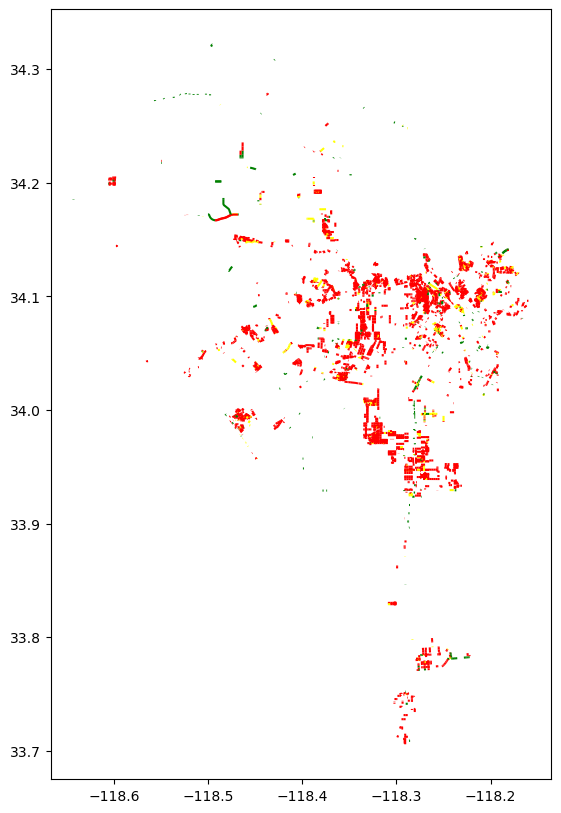

In [20]:
df_concrete = df_colorcond[df_colorcond.surf1=="Concrete"]

df_concrete.plot(figsize=(12,10),
                 color=df_concrete["flag"],
                 legend=True)


<Axes: >

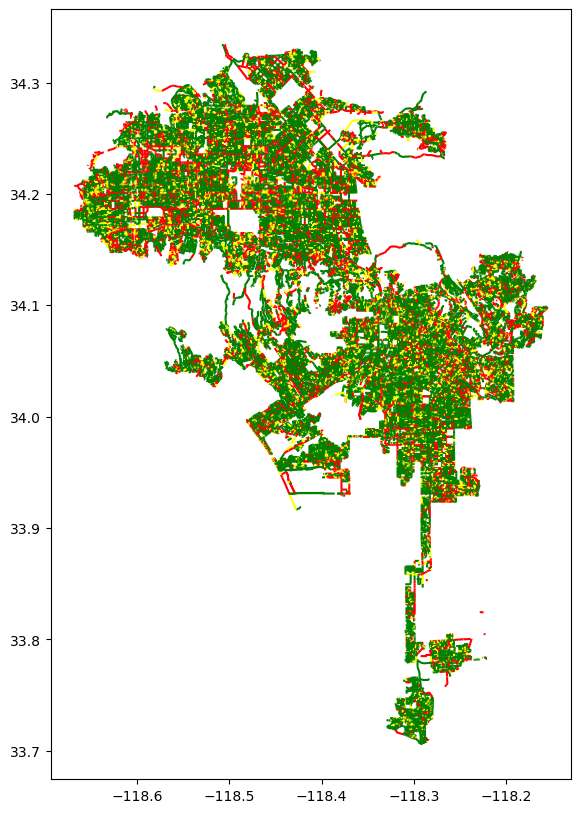

In [21]:
df_asphalt = df_colorcond[df_colorcond.surf1=="Asphalt"]

df_asphalt.plot(figsize=(12,10),
                 color=df_asphalt["flag"],
                 legend=True)


<Axes: >

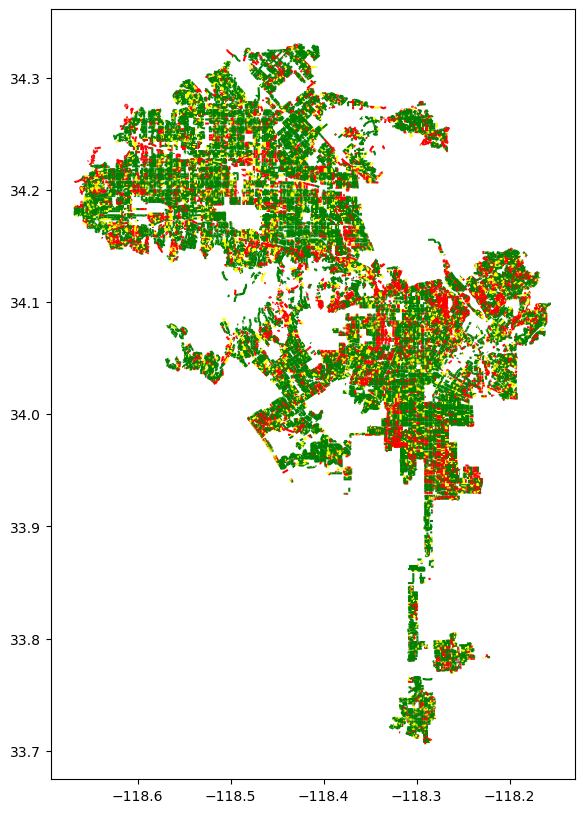

In [22]:
df_local = df_colorcond[df_colorcond.st_type=="Local"]

df_local.plot(figsize=(12,10),
                 color=df_local["flag"],
                 legend=True)


<Axes: >

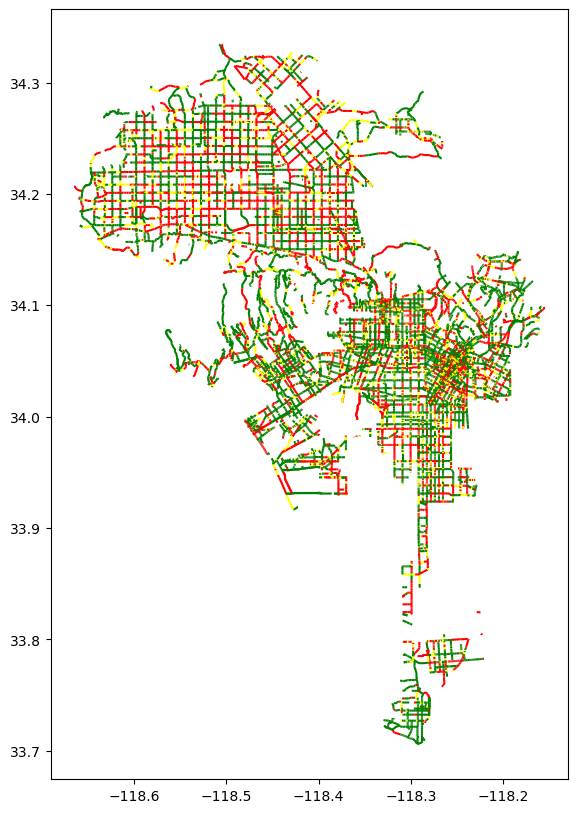

In [23]:
df_select = df_colorcond[df_colorcond.st_type=="Select"]

df_select.plot(figsize=(12,10),
                 color=df_select["flag"],
                 legend=True)


In [24]:
import matplotlib.pyplot as plt

import contextily as ctx



In [25]:
bbox = df_condition.total_bounds

print("Bounding box: ")
print("Min Long: " + str(bbox[0]))
print("Min Lat: " + str(bbox[1]))
print("Max Long: " + str(bbox[2]))
print("Max Lat: " + str(bbox[3]))

Bounding box: 
Min Long: -118.66779962253091
Min Lat: 33.705825334186066
Max Long: -118.15545233847024
Max Lat: 34.334346282425145


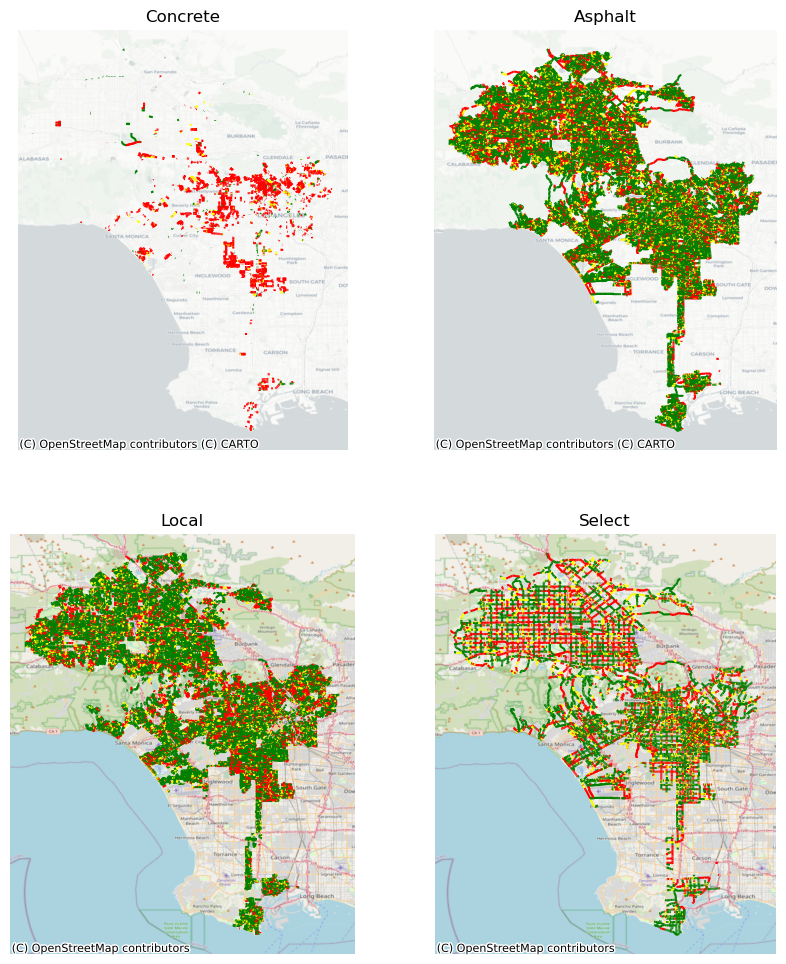

In [26]:
fig,ax = plt.subplots(2,2,figsize=(10,12))


df_concrete.plot(ax=ax[0][0],color=df_concrete.flag)
ax[0][0].axis('off')
ax[0][0].set_title('Concrete')

ctx.add_basemap(ax[0][0], source=ctx.providers.CartoDB.Positron,crs=4326)

# second map
df_asphalt.plot(ax=ax[0][1], color=df_asphalt.flag)

ax[0][1].axis('off')
ax[0][1].set_title('Asphalt')

ctx.add_basemap(ax[0][1], source=ctx.providers.CartoDB.Positron,crs=4326)

df_local.plot(ax=ax[1][0],color=df_local.flag)
ax[1][0].axis('off')
ax[1][0].set_title('Local')

ctx.add_basemap(ax[1][0], source=ctx.providers.OpenStreetMap.Mapnik,crs=4326)

# second map
df_select.plot(ax=ax[1][1], color=df_select.flag)

ax[1][1].axis('off')
ax[1][1].set_title('Select')

ctx.add_basemap(ax[1][1], source=ctx.providers.OpenStreetMap.Mapnik,crs=4326)

Most of the poor quality concrete streets appear to be in South Los Angeles, specifically clustered in the neighborhoods of Hancock Park, Los Feliz, and Park Mesa heights. 

### Taking a quick look at collision data to see if we can glean some similar spatial patterns

importing necessary packages for API query

In [27]:
# to import open data
from sodapy import Socrata

In [28]:
# connecting to the data portal
client = Socrata("data.lacity.org", None)
#will use this later to shorten time frame; Thanks Leila for providing this
#query = f"SELECT * WHERE date_occ >= '{2020}-01-01T00:00:00.000' AND date_occ < '{2021 + 1}-01-01T00:00:00.000'"
results = client.get("d5tf-ez2w",limit=5000)
# Convert to pandas DataFrame

collisions = pd.DataFrame.from_records(results)

# Close the Socrata client
client.close()




starting data exploration

In [29]:
collisions.head()

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,...,premis_desc,location,cross_street,location_1,:@computed_region_qz3q_ghft,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,:@computed_region_ur2y_g4cx,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s
0,190319651,2019-08-24T00:00:00.000,2019-08-24T00:00:00.000,0450,03,Southwest,0356,997,TRAFFIC COLLISION,3036 3004 3026 3101 4003,...,STREET,JEFFERSON BL,NORMANDIE AV,"{'latitude': '34.0255', 'longitude': '-118.300...",22724,691,916,7,14,32
1,190319680,2019-08-30T00:00:00.000,2019-08-30T00:00:00.000,2320,03,Southwest,0355,997,TRAFFIC COLLISION,3037 3006 3028 3030 3039 3101 4003,...,STREET,JEFFERSON BL,W WESTERN,"{'latitude': '34.0256', 'longitude': '-118.308...",23079,686,919,7,12,19
2,190413769,2019-08-25T00:00:00.000,2019-08-25T00:00:00.000,0545,04,Hollenbeck,0422,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030,...,STREET,N BROADWAY,W EASTLAKE AV,"{'latitude': '34.0738', 'longitude': '-118.207...",23448,488,516,NaN,11,1
3,190127578,2019-11-20T00:00:00.000,2019-11-20T00:00:00.000,0350,01,Central,0128,997,TRAFFIC COLLISION,0605 3101 3401 3701 3011 3034,...,STREET,1ST,CENTRAL,"{'latitude': '34.0492', 'longitude': '-118.239...",22728,536,1502,NaN,9,28
4,190319695,2019-08-30T00:00:00.000,2019-08-30T00:00:00.000,2100,03,Southwest,0374,997,TRAFFIC COLLISION,0605 4025 3037 3004 3025 3101,...,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"{'latitude': '34.0108', 'longitude': '-118.318...",22725,747,1017,7,14,35


In [30]:
collisions.shape

(5000, 24)

In [31]:
#using this to pick what columns to use
pd.set_option('display.max_columns', None)
collisions.info


<bound method DataFrame.info of           dr_no                date_rptd                 date_occ time_occ  \
0     190319651  2019-08-24T00:00:00.000  2019-08-24T00:00:00.000     0450   
1     190319680  2019-08-30T00:00:00.000  2019-08-30T00:00:00.000     2320   
2     190413769  2019-08-25T00:00:00.000  2019-08-25T00:00:00.000     0545   
3     190127578  2019-11-20T00:00:00.000  2019-11-20T00:00:00.000     0350   
4     190319695  2019-08-30T00:00:00.000  2019-08-30T00:00:00.000     2100   
...         ...                      ...                      ...      ...   
4995  190122323  2019-09-04T00:00:00.000  2019-09-04T00:00:00.000     0655   
4996  190122405  2019-09-05T00:00:00.000  2019-09-05T00:00:00.000     1230   
4997  190122408  2019-09-04T00:00:00.000  2019-09-04T00:00:00.000     1415   
4998  190122409  2019-09-05T00:00:00.000  2019-07-06T00:00:00.000     1410   
4999  190122423  2019-09-05T00:00:00.000  2019-08-31T00:00:00.000     1045   

     area   area_name rpt_dist_

In [32]:
#converting to GeoDataFrame to begin mapping
df_collision = gpd.GeoDataFrame(collisions,crs='epsg:4326',
                       geometry=gpd.points_from_xy(collisions.location_1.apply(lambda x: x.get("longitude")), collisions.location_1.apply(lambda x: x.get("latitude"))))

In [33]:
#validation that dataframe was converetd correctly; look for a geometry column
df_collision.head()

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1,:@computed_region_qz3q_ghft,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,:@computed_region_ur2y_g4cx,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s,geometry
0,190319651,2019-08-24T00:00:00.000,2019-08-24T00:00:00.000,0450,03,Southwest,0356,997,TRAFFIC COLLISION,3036 3004 3026 3101 4003,22,M,H,101,STREET,JEFFERSON BL,NORMANDIE AV,"{'latitude': '34.0255', 'longitude': '-118.300...",22724,691,916,7,14,32,POINT (-118.30020 34.02550)
1,190319680,2019-08-30T00:00:00.000,2019-08-30T00:00:00.000,2320,03,Southwest,0355,997,TRAFFIC COLLISION,3037 3006 3028 3030 3039 3101 4003,30,F,H,101,STREET,JEFFERSON BL,W WESTERN,"{'latitude': '34.0256', 'longitude': '-118.308...",23079,686,919,7,12,19,POINT (-118.30890 34.02560)
2,190413769,2019-08-25T00:00:00.000,2019-08-25T00:00:00.000,0545,04,Hollenbeck,0422,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030,NaN,M,X,101,STREET,N BROADWAY,W EASTLAKE AV,"{'latitude': '34.0738', 'longitude': '-118.207...",23448,488,516,NaN,11,1,POINT (-118.20780 34.07380)
3,190127578,2019-11-20T00:00:00.000,2019-11-20T00:00:00.000,0350,01,Central,0128,997,TRAFFIC COLLISION,0605 3101 3401 3701 3011 3034,21,M,H,101,STREET,1ST,CENTRAL,"{'latitude': '34.0492', 'longitude': '-118.239...",22728,536,1502,NaN,9,28,POINT (-118.23910 34.04920)
4,190319695,2019-08-30T00:00:00.000,2019-08-30T00:00:00.000,2100,03,Southwest,0374,997,TRAFFIC COLLISION,0605 4025 3037 3004 3025 3101,49,M,B,101,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"{'latitude': '34.0108', 'longitude': '-118.318...",22725,747,1017,7,14,35,POINT (-118.31820 34.01080)


<Axes: >

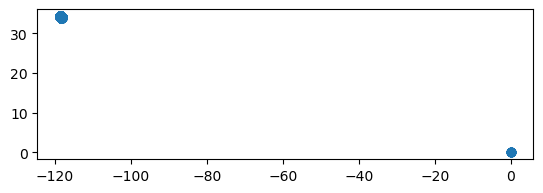

In [34]:
df_collision.plot()

Yeah..that didn't look great 😐. 

Seems like there is an origin point which needs to be removed

In [35]:
print(df_collision.location_1.apply(lambda x: float(x.get("longitude"))))
print(df_collision.geometry)
df_collision['long'] = df_collision.location_1.apply(lambda x: float(x.get("longitude")))
df_collision['lat'] = df_collision.location_1.apply(lambda x: float(x.get("latitude")))

0      -118.3002
1      -118.3089
2      -118.2078
3      -118.2391
4      -118.3182
          ...   
4995   -118.2438
4996   -118.2452
4997   -118.2657
4998   -118.2666
4999   -118.2553
Name: location_1, Length: 5000, dtype: float64
0       POINT (-118.30020 34.02550)
1       POINT (-118.30890 34.02560)
2       POINT (-118.20780 34.07380)
3       POINT (-118.23910 34.04920)
4       POINT (-118.31820 34.01080)
                   ...             
4995    POINT (-118.24380 34.04800)
4996    POINT (-118.24520 34.04230)
4997    POINT (-118.26570 34.04590)
4998    POINT (-118.26660 34.04230)
4999    POINT (-118.25530 34.04880)
Name: geometry, Length: 5000, dtype: geometry


Looking for just LA county in the following graph

<Axes: >

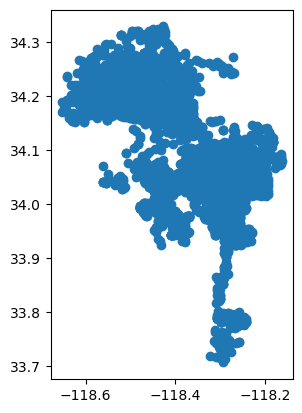

In [36]:
df_collision= df_collision[df_collision.long!=0]
df_collision.plot()

Making it interactive since there are so many data points

In [37]:
import plotly.express as px

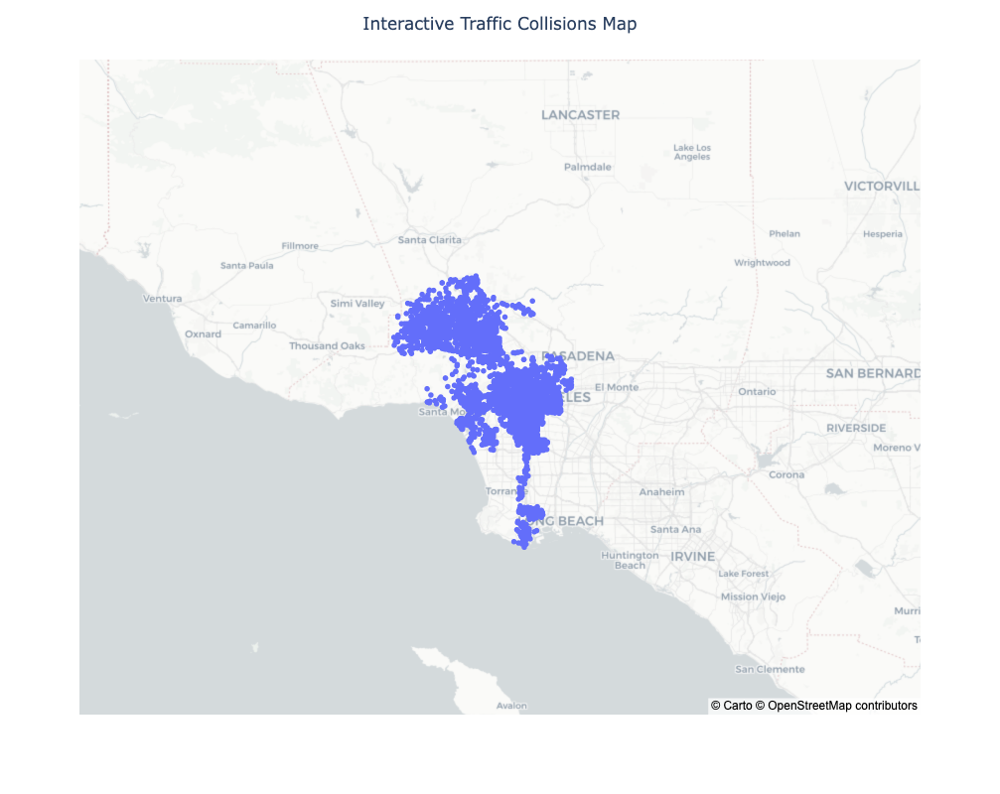

In [38]:
fig = px.scatter_mapbox(df_collision,
                        lat='lat',
                        lon='long',
                        mapbox_style="carto-positron")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive Traffic Collisions Map",
    title_x=0.5 # aligns title to center
)

fig.show()

Using Age to Stratify the Data

In [39]:
df_collision.vict_age = df_collision.vict_age.astype(float,errors='ignore')
df_collision.vict_age.max()

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



99.0

Bounds confirmed to be [0,99]. Let's create five intervals with that.

In [40]:

age_intervals = [0,20,40,60,80,100]
color_intervals = ["red","orange","yellow","green","blue"]

Definition a method to map the intervals

In [41]:
def age_strat_map(df,start,end,color):
    fig = px.scatter_mapbox(df,
                            lat='lat',
                            lon='long',
                            color_discrete_sequence=[color],
                            mapbox_style="carto-positron")
    
    # options on the layout
    fig.update_layout(
        width = 800,
        height = 800,
        title = "Interactive Traffic Collisions Map (Ages " + str(start) + "-" + str(end) + ")",
        title_x=0.5 # aligns title to center
    )
    
    fig.show()



Iterating through the intervals

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



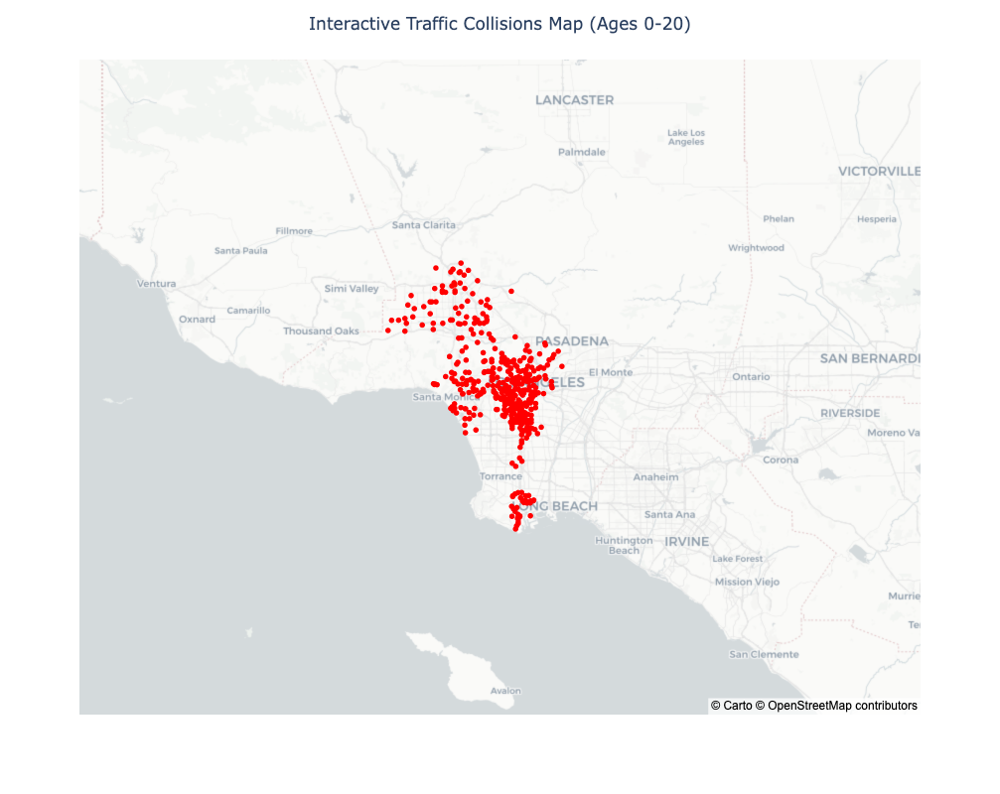

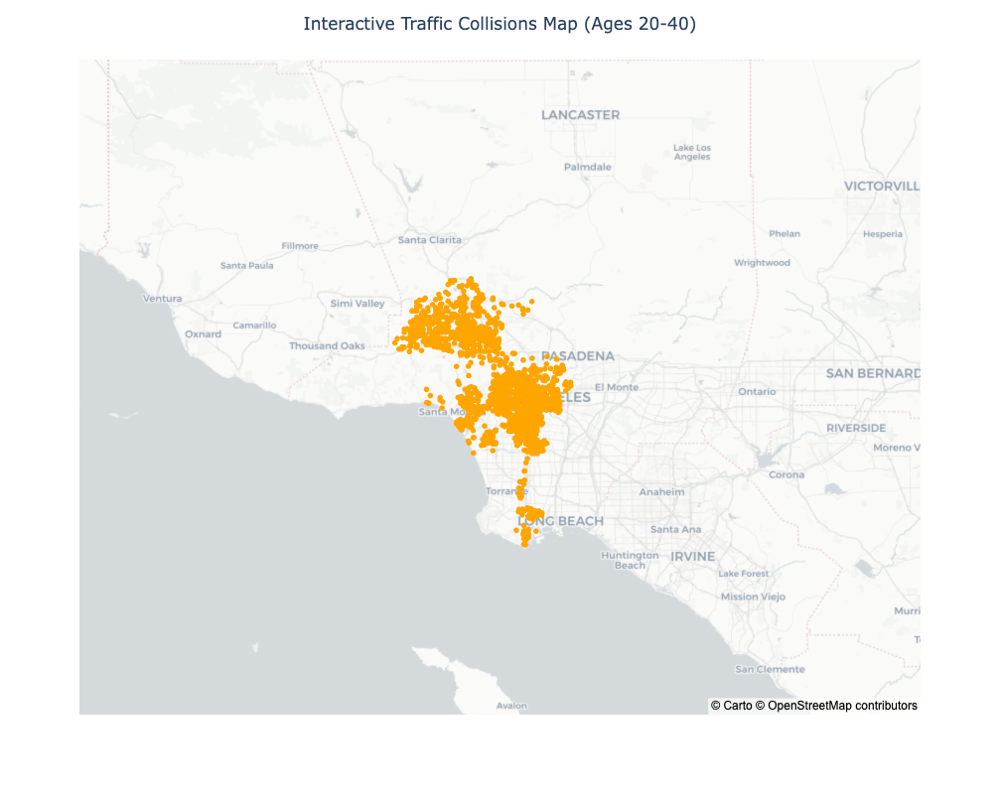

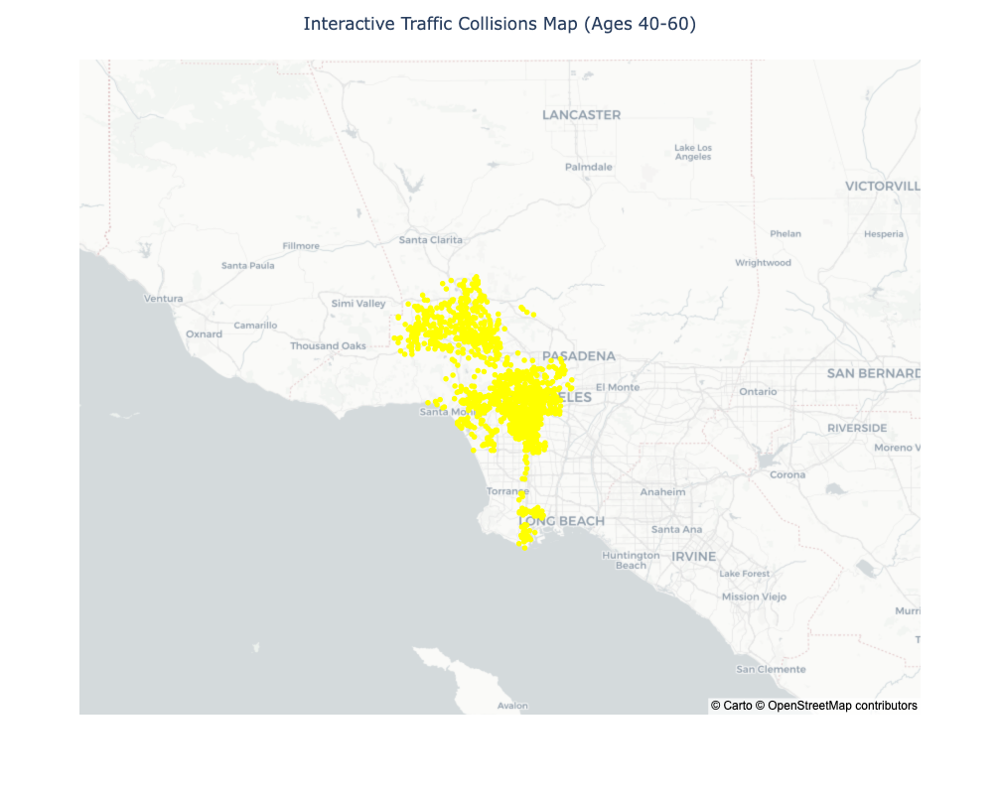

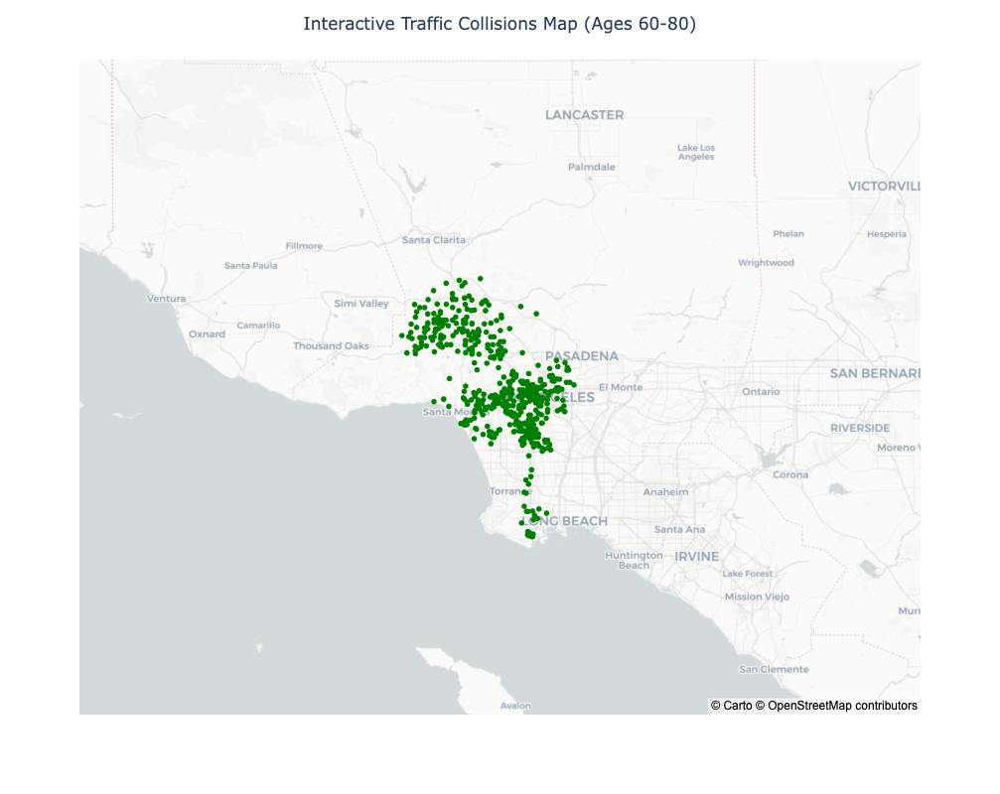

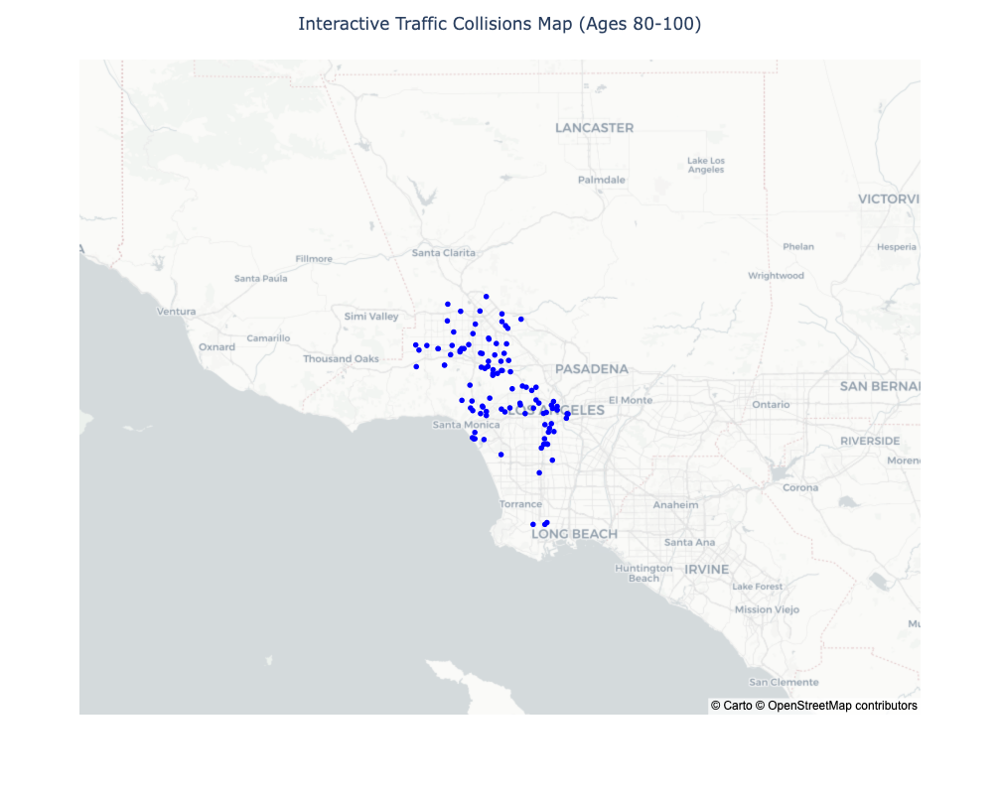

In [48]:
df_collision["interval"] = ""
for i in range(1,len(age_intervals)):
    age_strat_map(df_collision[(df_collision.vict_age>=age_intervals[i-1]) & (df_collision.vict_age<age_intervals[i])],age_intervals[i-1],age_intervals[i],color_intervals[i-1])
    df_collision.loc[(df_collision.vict_age>=age_intervals[i-1]) & (df_collision.vict_age<age_intervals[i]),"interval"] = str(age_intervals[i-1]) + "-" + str(age_intervals[i])
    
    

Consolidating the information

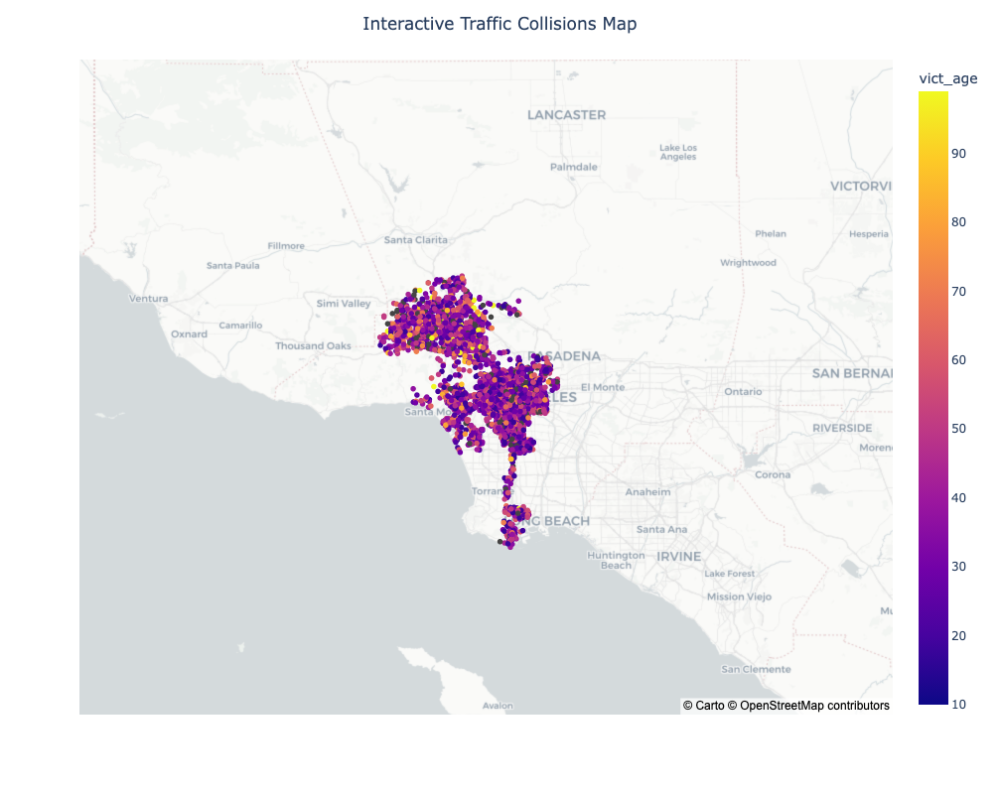

In [43]:
fig = px.scatter_mapbox(df_collision,
                        lat='lat',
                        lon='long',
                        color='vict_age',
                        mapbox_style="carto-positron")
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive Traffic Collisions Map",
    title_x=0.5 # aligns title to center
)
fig.show()

Using the color scheme we created, even though it's uglier. 

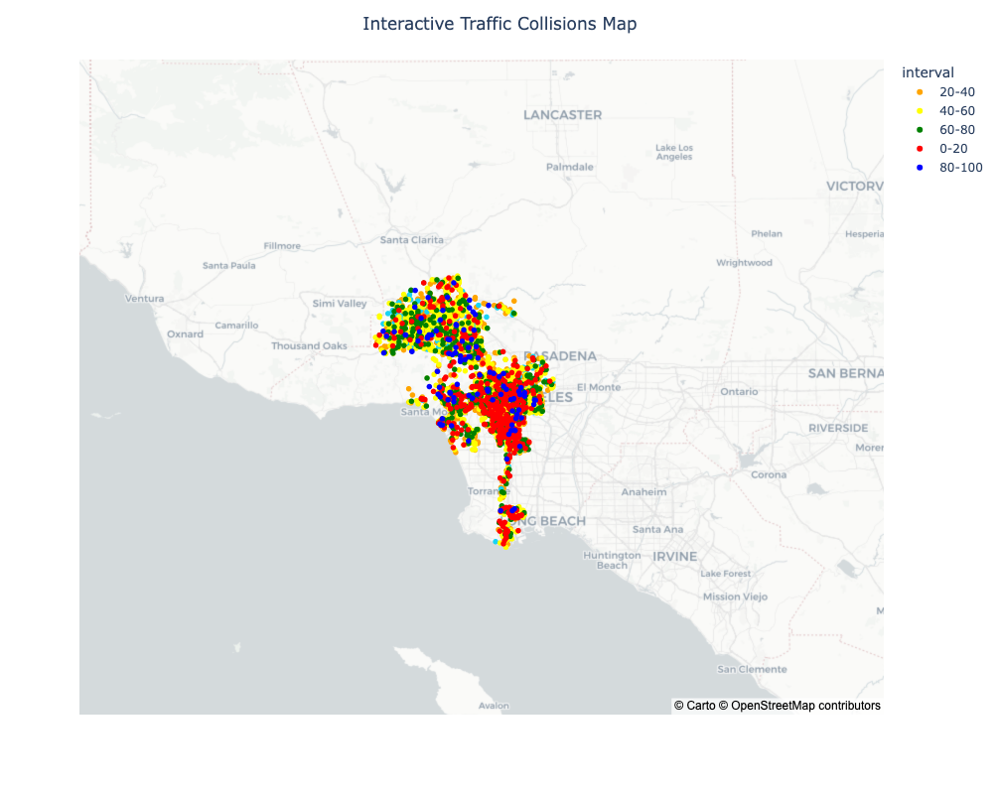

In [46]:
fig = px.scatter_mapbox(df_collision,
                        lat='lat',
                        lon='long',
                        color='interval',
                        color_discrete_map = {str(age_intervals[i-1]) + "-" + str(age_intervals[i]): color_intervals[i-1] for i in range(1,len(age_intervals))},
                        mapbox_style="carto-positron")
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive Traffic Collisions Map",
    title_x=0.5 # aligns title to center
)
fig.show()

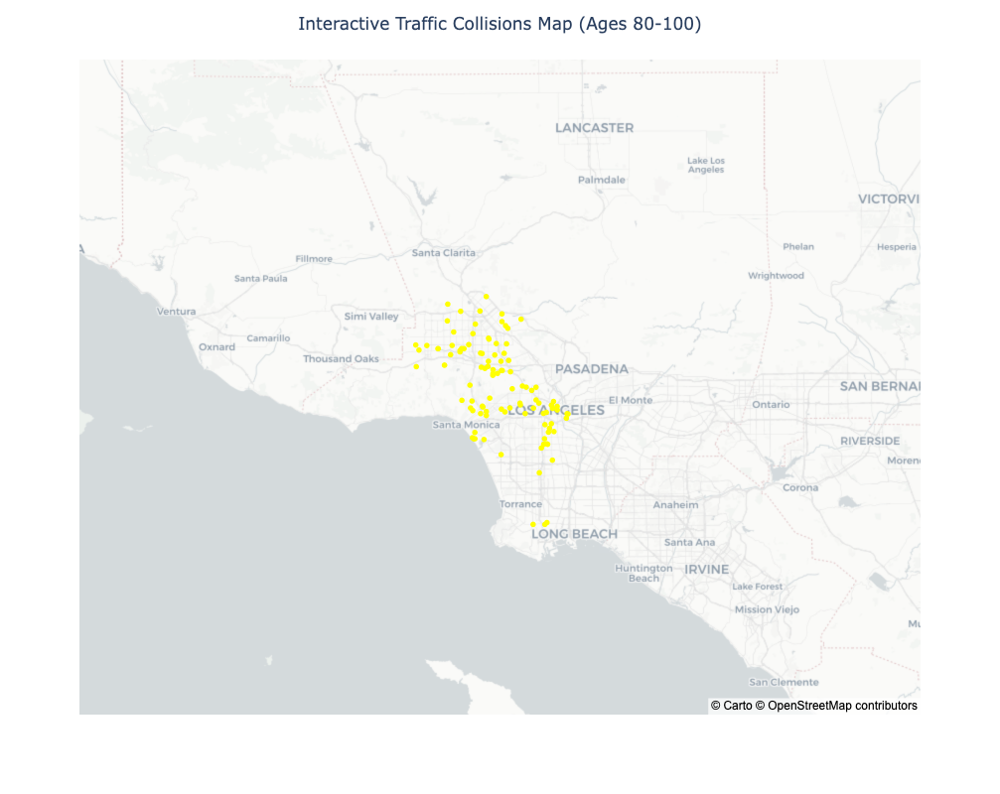

In [47]:
age_strat_map(df_collision[(df_collision.vict_age>=age_intervals[i-1]) & (df_collision.vict_age<age_intervals[i])],age_intervals[i-1],age_intervals[i],"yellow")